In [364]:
# go into the server code, run it to control your car

In [365]:
# after demo, we see our model does not run very well, it's due to the small dataset that's we'll been training on, 
# so we need several more technics, we'll copy all the codes from tut9 
# and modify, add some more technics

In [366]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense
import cv2
import pandas as pd
import random

In [367]:
import os

datadir = 'selfDrivingCar_datasets'
columns = ['center_img', 'left_img', 'right_img', 'steering', 'throttle', 'reverse', 'speed'] # column name of a car dataset

# selfDrivingCar_datasets/driving_log.csv (maybe '/' on linux and '\' on windows) --> just easier for crossplatform
filePath = os.path.join(
    datadir, 'driving_log.csv'
) 

data = pd.read_csv(
    filepath_or_buffer=filePath,
    names=columns # since there are no columns name in the dataset, we want to name it (we already know what they are)
)

pd.set_option('display.max_colwidth', None) # by default, info too long will be cut off, we want to see it all
data.head()

,center_img,left_img,right_img,steering,throttle,reverse,speed
0,C:\Home\development\self_driving_simulator-windows-64\IMG\center_2023_01_02_00_00_57_994.jpg,C:\Home\development\self_driving_simulator-windows-64\IMG\left_2023_01_02_00_00_57_994.jpg,C:\Home\development\self_driving_simulator-windows-64\IMG\right_2023_01_02_00_00_57_994.jpg,0.0,0.0,0.0,0.000078
1,C:\Home\development\self_driving_simulator-windows-64\IMG\center_2023_01_02_00_00_58_095.jpg,C:\Home\development\self_driving_simulator-windows-64\IMG\left_2023_01_02_00_00_58_095.jpg,C:\Home\development\self_driving_simulator-windows-64\IMG\right_2023_01_02_00_00_58_095.jpg,0.0,0.0,0.0,0.000078
2,C:\Home\development\self_driving_simulator-windows-64\IMG\center_2023_01_02_00_00_58_196.jpg,C:\Home\development\self_driving_simulator-windows-64\IMG\left_2023_01_02_00_00_58_196.jpg,C:\Home\development\self_driving_simulator-windows-64\IMG\right_2023_01_02_00_00_58_196.jpg,0.0,0.0,0.0,0.000079
3,C:\Home\development\self_driving_simulator-windows-64\IMG\center_2023_01_02_00_00_58_299.jpg,C:\Home\development\self_driving_simulator-windows-64\IMG\left_2023_01_02_00_00_58_299.jpg,C:\Home\development\self_driving_simulator-windows-64\IMG\right_2023_01_02_00_00_58_299.jpg,0.0,0.0,0.0,0.000078
4,C:\Home\development\self_driving_simulator-windows-64\IMG\center_2023_01_02_00_00_58_399.jpg,C:\Home\development\self_driving_simulator-windows-64\IMG\left_2023_01_02_00_00_58_399.jpg,C:\Home\development\self_driving_simulator-windows-64\IMG\right_2023_01_02_00_00_58_399.jpg,0.0,0.0,0.0,0.000082


In [368]:
import ntpath

def path_leaf(path):
    head, tail = ntpath.split(path)
    return tail

# apply function to all rows in a column
data['center_img'] = data['center_img'].apply(path_leaf)
data['left_img'] = data['left_img'].apply(path_leaf)
data['right_img'] = data['right_img'].apply(path_leaf)
data.head()

,center_img,left_img,right_img,steering,throttle,reverse,speed
0,center_2023_01_02_00_00_57_994.jpg,left_2023_01_02_00_00_57_994.jpg,right_2023_01_02_00_00_57_994.jpg,0.0,0.0,0.0,0.000078
1,center_2023_01_02_00_00_58_095.jpg,left_2023_01_02_00_00_58_095.jpg,right_2023_01_02_00_00_58_095.jpg,0.0,0.0,0.0,0.000078
2,center_2023_01_02_00_00_58_196.jpg,left_2023_01_02_00_00_58_196.jpg,right_2023_01_02_00_00_58_196.jpg,0.0,0.0,0.0,0.000079
3,center_2023_01_02_00_00_58_299.jpg,left_2023_01_02_00_00_58_299.jpg,right_2023_01_02_00_00_58_299.jpg,0.0,0.0,0.0,0.000078
4,center_2023_01_02_00_00_58_399.jpg,left_2023_01_02_00_00_58_399.jpg,right_2023_01_02_00_00_58_399.jpg,0.0,0.0,0.0,0.000082


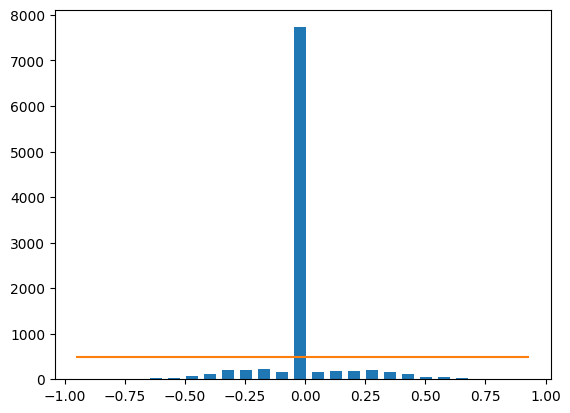

In [369]:
num_bins = 25 
# looked like we have remove too much of our 0 angle driving from previous tut9
# cut down to 200, but we still want our car to prefer the middle lane
samples_per_bin = 500

plt.hist(data['steering'], num_bins, width = 0.05);
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin));

total initial data:  9889
removed: 7229
remaining: 2660


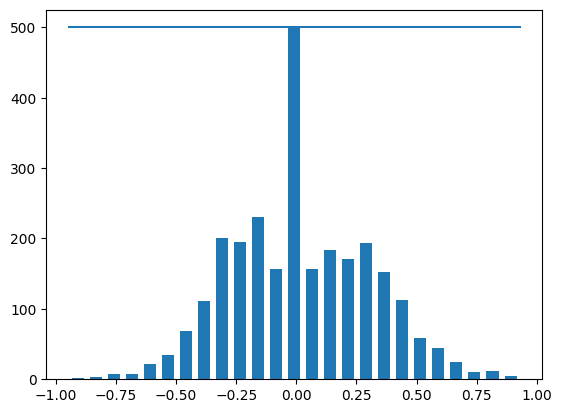

In [370]:
# balancing data
from sklearn.utils import shuffle

print('total initial data: ', len(data))

remove_list = [] # specify the samples we want to remove
hist, bins = np.histogram(data['steering'], num_bins) # for getting the bins[] array 
centers = (bins[1:] + bins[:-1]) * 0.5

for j in range(num_bins): # current bin (a steering angle)
  list_ = [] 
  for i in range(len(data['steering'])): # current angle in 'steering' column

    # if the current angle in 'steering' column is between the 2 bins (2 steering angles)
    # then current angle belongs to current bin
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)

  list_ = shuffle(list_) # randomize after getting the data, so when remove the data, it still can GENERALIZE for the whole car track
  list_ = list_[samples_per_bin:] # thresh hold --> only get first 200 angles, the rest will be moved to REMOVE list
  remove_list.extend(list_) # spread the contents of what we want to dispose
 
print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True) # drop data (rows) based on specified index data
print('remaining:', len(data)) 

hist, _ = np.histogram(data['steering'], num_bins)
plt.bar(centers, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

Training Samples: 2128
Valid Samples: 532


Text(0.5, 1.0, 'Validation set')

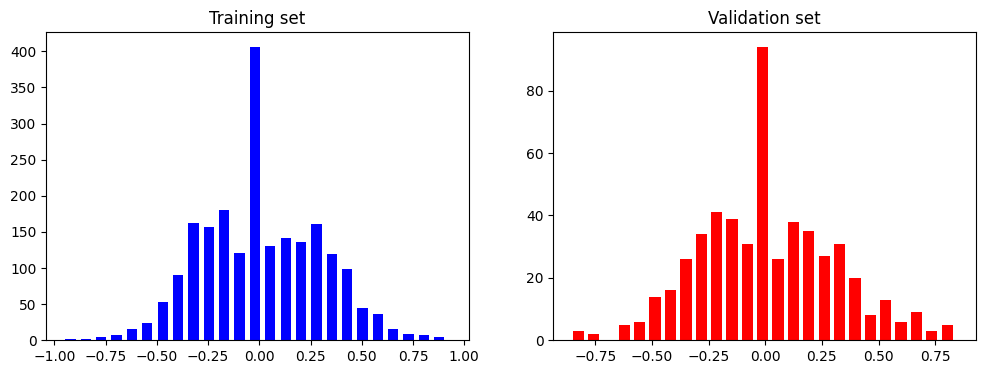

In [371]:
from sklearn.model_selection import train_test_split

def load_img_steering(datadir, df):
    image_path = [] # input X
    steering = [] # label y

    for i in range(len(data)):
        indexed_data = data.iloc[i]
        center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]

        # center image append (right now just get the center image)
        image_path.append(os.path.join(datadir, center.strip())) # strip() is just eliminate any spaces that maybe present in the string
        steering.append(float(indexed_data[3])) # current angle

    # change to numpy array for better later minipulated
    image_paths = np.asarray(image_path)
    steerings = np.asarray(steering)
    return image_paths, steerings


image_paths, steerings = load_img_steering(datadir + '/IMG', data)

X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))


fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Text(0.5, 1.0, 'Zoomed Image')

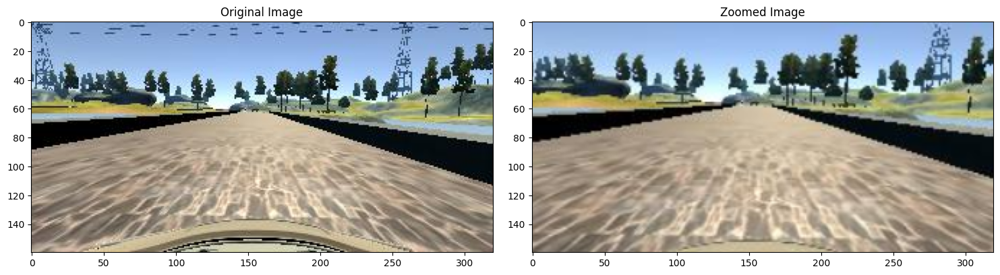

In [372]:
# CUSTOM DATA AUGUMENTATION
from imgaug import augmenters as iaa
import matplotlib.image as mpimg

def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3)) # range for zoom, 1 means no zoom, 1.3 means zoom upto 30%
  image = zoom.augment_image(image)
  return image

img_path = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(img_path)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Panned Image')

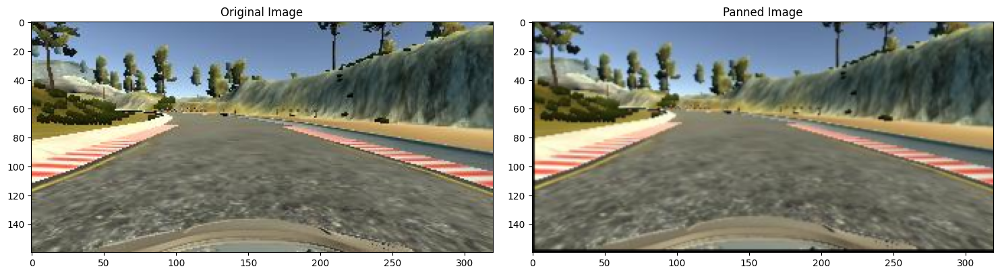

In [373]:
def pan(image):
  pan = iaa.Affine(translate_percent= { # keyword
    "x" : (-0.1, 0.1), "y": (-0.1, 0.1) # translation range for x: 10% left and 10% right, respective for y
  }) 
  image = pan.augment_image(image)
  return image

img_path = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(img_path)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness altered image ')

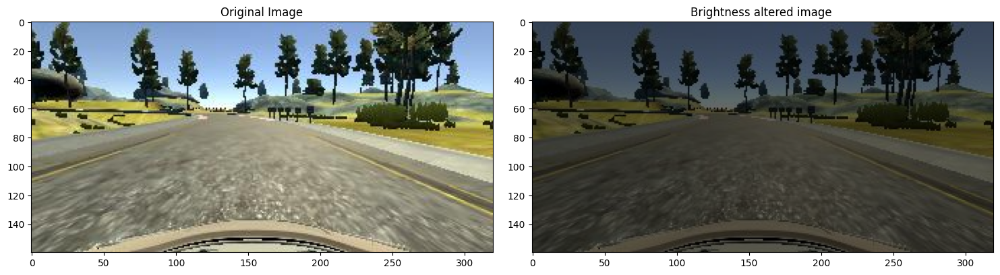

In [374]:
def img_random_brightness(image):
    # multiply all the pixels intensity
    # thus any pixel intensity multiplied by a value less than 1
    # will become darker
    # the model seems to detect better with darker images
    brightness = iaa.Multiply((0.2, 1.2)) 
    image = brightness.augment_image(image)
    return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.07441954')

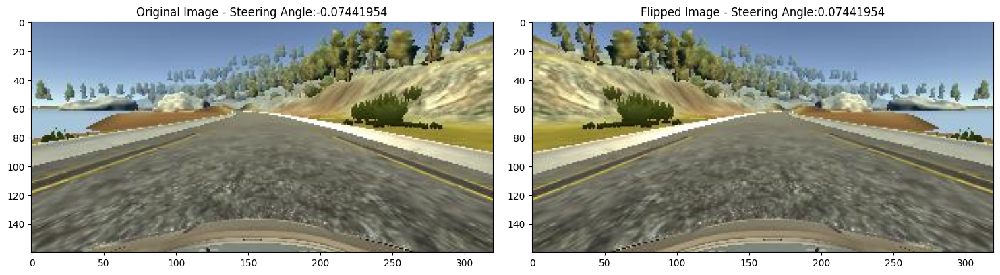

In [375]:
# flipping images can produce additional balancing

def img_random_flip(image, steering_angle):
    image = cv2.flip(image, 1) # 0: vertical flip, 1: horizontal flip, -1: combine both
    steering_angle = -steering_angle # flip the steering angle as well (label)
    return image, steering_angle 

random_index = random.randint(0, 1000)
img_path = image_paths[random_index]
steering_angle = steerings[random_index]


original_image = mpimg.imread(img_path)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

In [376]:
# combine all image augmentation methods above
# adding variaty, improve genrerlization for our model

def random_augment(image, steering_angle):
  image = mpimg.imread(image)

  # only run augmentation functions 50% of the time
  # this means on average, each augmentation will only be applied to 50% of the newly augmented images
  if np.random.rand() < 0.5: 
    image = pan(image)
  if np.random.rand() < 0.5:
    image = zoom(image)
  if np.random.rand() < 0.5:
    image = img_random_brightness(image)
  if np.random.rand() < 0.5:
    image, steering_angle = img_random_flip(image, steering_angle)

  return image, steering_angle

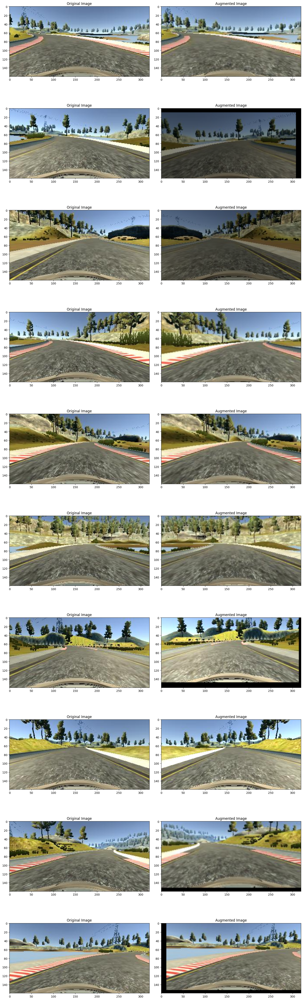

In [377]:
ncol = 2
nrow = 10 
# 10 images side by side
# 10 original and 10 augmented

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]
    
  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)
    
  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")
  
  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

In [378]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

def batch_generator(
    image_paths, steering_ang, 
    batch_size, # size of the batch images that it should create
    istraining # used when we're testing on validation data, we don't want to augument that data
):
  while True:
    batch_img = []
    batch_steering = []
    
    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)
      
      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index]) # random augmentation
      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]
      
      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)

    # yield is like a RETURN in a function, which is made used of the generator
    # it actually the function's current state, (puts the batch generator on hold) 
    # and at next function call, it will start at it's point and keep running 
    # in short: it only STOP MOMENTARILY for the YIELD 
    # (dừng vòng lặp tạm thời và chạy tiếp ở lần sau)
    yield (np.asarray(batch_img), np.asarray(batch_steering)) # return X inputs [], y labels []

Text(0.5, 1.0, 'Validation Image')

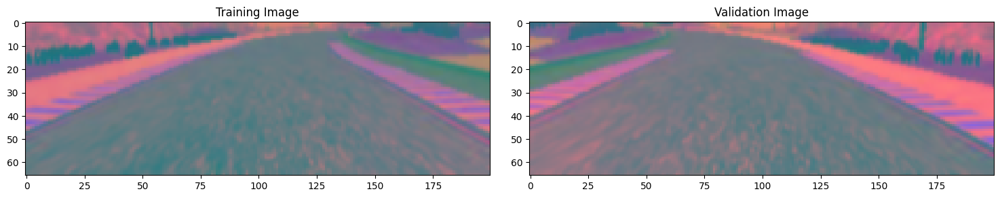

In [379]:
# use next to request the next batch from our generator

x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [380]:
# NVIDIA MODEL
# https://developer.nvidia.com/blog/deep-learning-self-driving-cars/

def nvidia_model():
    model = Sequential()
    # Nvidia model makes use of 24 filters 
    # subsmaple has been replaced with strides
    # simply just a 5x5 filter move 2 blocks each time
    model.add(Convolution2D(24, (5, 5), 
        strides=(2, 2), 
        input_shape=(66, 200, 3), 
        activation='elu')
    )

    model.add(Convolution2D(36, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Convolution2D(48, (5, 5), strides=(2, 2), activation='elu'))

    # at this point, the input image's dimension has decreased signigicantly 
    # for this reason, we just want normal strides = (1, 1) by default
    model.add(Convolution2D(64, (3, 3), activation='elu'))
    model.add(Convolution2D(64, (3, 3), activation='elu'))
    # model.add(Dropout(0.5))
     
    model.add(Flatten()) # ----------------------------------------------
    
    model.add(Dense(100, activation = 'elu'))
    # model.add(Dropout(0.5))
    
    model.add(Dense(50, activation = 'elu'))
    # model.add(Dropout(0.5)) # add more dropout layer to have well trained model
    
    model.add(Dense(10, activation = 'elu'))
    # model.add(Dropout(0.5)) 
    # ----> since we're using data augmentation, overfitting no longer a trougble,
    # so disabling drop out layer can actually lower the error  

    # output layer: car control
    model.add(Dense(1))
    
    optimizer = Adam(lr=1e-4) # modify the learning-rate if you see the graph is too stiff up and down, 
    # keep running far away from global minimum (gradient descent)
    model.compile(loss='mse', optimizer=optimizer)
    return model

model = nvidia_model()
print(model.summary())

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_85 (Conv2D)          (None, 31, 98, 24)        1824      
                                                                 
 conv2d_86 (Conv2D)          (None, 14, 47, 36)        21636     
                                                                 
 conv2d_87 (Conv2D)          (None, 5, 22, 48)         43248     
                                                                 
 conv2d_88 (Conv2D)          (None, 3, 20, 64)         27712     
                                                                 
 conv2d_89 (Conv2D)          (None, 1, 18, 64)         36928     
                                                                 
 flatten_17 (Flatten)        (None, 1152)              0         
                                                                 
 dense_68 (Dense)            (None, 100)             

c:\Home\development\me-selflearn-machinelearning\machinelearningenv\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [381]:
# data augmentation ----------------------------------
batch_size = 50

history = model.fit(
    x=batch_generator(X_train, y_train, batch_size, 1),
    steps_per_epoch= len(X_train) // batch_size,
    epochs=50,
    validation_data=batch_generator(X_valid, y_valid, batch_size, 0),
    validation_steps=len(X_valid) // batch_size,
    shuffle = 1,
    verbose=1
)

Epoch 1/50
42/42 [==============================] - 11s 255ms/step - loss: 0.0728 - val_loss: 0.0689
Epoch 2/50
42/42 [==============================] - 7s 176ms/step - loss: 0.0659 - val_loss: 0.0567
Epoch 3/50
42/42 [==============================] - 7s 160ms/step - loss: 0.0595 - val_loss: 0.0524
Epoch 4/50
42/42 [==============================] - 5s 123ms/step - loss: 0.0552 - val_loss: 0.0571
Epoch 5/50
42/42 [==============================] - 5s 115ms/step - loss: 0.0573 - val_loss: 0.0461
Epoch 6/50
42/42 [==============================] - 5s 117ms/step - loss: 0.0504 - val_loss: 0.0422
Epoch 7/50
42/42 [==============================] - 5s 110ms/step - loss: 0.0556 - val_loss: 0.0585
Epoch 8/50
42/42 [==============================] - 5s 109ms/step - loss: 0.0503 - val_loss: 0.0505
Epoch 9/50
42/42 [==============================] - 4s 109ms/step - loss: 0.0478 - val_loss: 0.0377
Epoch 10/50
42/42 [==============================] - 5s 110ms/step - loss: 0.0480 - val_loss: 0.042

Text(0.5, 0, 'epoch')

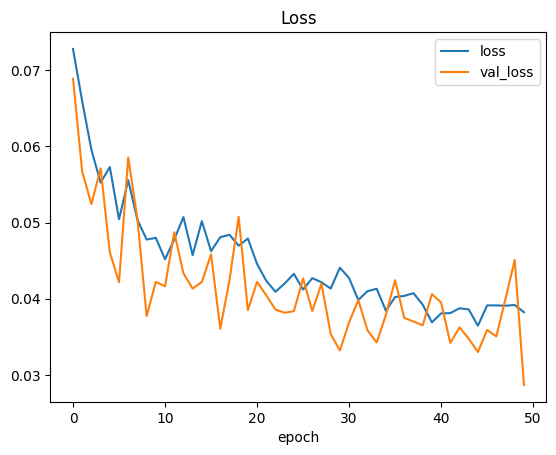

In [382]:
plt.plot(history.history['loss']) # loss / error
plt.plot(history.history['val_loss']) # validation loss / error
plt.legend(['loss', 'val_loss'])
plt.title('Loss')
plt.xlabel('epoch')

In [383]:
# finally saving our model :)
model_path = os.path.join('behavioral_cloning', 'self_driving_car_model_3.h5')
model.save(model_path)